In [1]:
'''Importing Data Manipulation Modules'''
import numpy as np                 # Linear Algebra
import pandas as pd                # Data Processing, CSV file I/O (e.g. pd.read_csv)

'''Seaborn and Matplotlib Visualization'''
import matplotlib                  # 2D Plotting Library
import matplotlib.pyplot as plt
import seaborn as sns              # Python Data Visualization Library based on matplotlib
import geopandas as gpd            # Python Geospatial Data Library
plt.style.use('fivethirtyeight')
%matplotlib inline

'''Plotly Visualizations'''
import plotly as plotly                # Interactive Graphing Library for Python
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot, plot
init_notebook_mode(connected=True)


'''Machine Learning'''
import sklearn
from sklearn import preprocessing
from sklearn import metrics
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression,LogisticRegression
from sklearn.ensemble import RandomForestRegressor,  GradientBoostingRegressor


In [2]:
df = pd.read_csv("/Users/shilp/Downloads/new-york-city-airbnb-open-data/AB_NYC_2019.csv")
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [5]:
df.shape

(48895, 16)

In [3]:

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
id                                48895 non-null int64
name                              48879 non-null object
host_id                           48895 non-null int64
host_name                         48874 non-null object
neighbourhood_group               48895 non-null object
neighbourhood                     48895 non-null object
latitude                          48895 non-null float64
longitude                         48895 non-null float64
room_type                         48895 non-null object
price                             48895 non-null int64
minimum_nights                    48895 non-null int64
number_of_reviews                 48895 non-null int64
last_review                       38843 non-null object
reviews_per_month                 38843 non-null float64
calculated_host_listings_count    48895 non-null int64
availability_365                  48895 non-null int64

In [4]:
df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [6]:
for column in df.columns:
    if df[column].isnull().sum() != 0:
        print("=======================================================")
        print(f"{column} ==> Missing Values : {df[column].isnull().sum()}, dtypes : {df[column].dtypes}")

name ==> Missing Values : 16, dtypes : object
host_name ==> Missing Values : 21, dtypes : object
last_review ==> Missing Values : 10052, dtypes : object
reviews_per_month ==> Missing Values : 10052, dtypes : float64


In [7]:
df['name'].unique()

array(['Clean & quiet apt home by the park', 'Skylit Midtown Castle',
       'THE VILLAGE OF HARLEM....NEW YORK !', ...,
       'Sunny Studio at Historical Neighborhood',
       '43rd St. Time Square-cozy single bed',
       "Trendy duplex in the very heart of Hell's Kitchen"], dtype=object)

In [8]:
df['name'].fillna('', inplace=True)
df['name'].unique()

array(['Clean & quiet apt home by the park', 'Skylit Midtown Castle',
       'THE VILLAGE OF HARLEM....NEW YORK !', ...,
       'Sunny Studio at Historical Neighborhood',
       '43rd St. Time Square-cozy single bed',
       "Trendy duplex in the very heart of Hell's Kitchen"], dtype=object)

In [9]:
df.isnull().sum()

id                                    0
name                                  0
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [10]:
df['host_name'].unique()

array(['John', 'Jennifer', 'Elisabeth', ..., 'Abayomi', 'Alberth',
       'Ilgar & Aysel'], dtype=object)

In [11]:
df['host_name'].fillna('', inplace=True)
df['host_name'].unique()

array(['John', 'Jennifer', 'Elisabeth', ..., 'Abayomi', 'Alberth',
       'Ilgar & Aysel'], dtype=object)

In [12]:
df.isnull().sum()

id                                    0
name                                  0
host_id                               0
host_name                             0
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [13]:
df['last_review'].unique()

array(['2018-10-19', '2019-05-21', nan, ..., '2017-12-23', '2018-01-29',
       '2018-03-29'], dtype=object)

In [14]:
df['last_review'].fillna('0', inplace=True)

In [16]:
df['reviews_per_month'].fillna((df['reviews_per_month'].mean()), inplace=True)
df['reviews_per_month'].unique()

array([2.10000000e-01, 3.80000000e-01, 1.37322143e+00, 4.64000000e+00,
       1.00000000e-01, 5.90000000e-01, 4.00000000e-01, 3.47000000e+00,
       9.90000000e-01, 1.33000000e+00, 4.30000000e-01, 1.50000000e+00,
       1.34000000e+00, 9.10000000e-01, 2.20000000e-01, 1.20000000e+00,
       1.72000000e+00, 2.12000000e+00, 4.44000000e+00, 7.00000000e-02,
       1.09000000e+00, 3.70000000e-01, 6.10000000e-01, 7.30000000e-01,
       1.37000000e+00, 4.90000000e-01, 1.11000000e+00, 2.40000000e-01,
       2.04000000e+00, 1.42000000e+00, 1.65000000e+00, 2.37000000e+00,
       6.60000000e-01, 1.41000000e+00, 1.96000000e+00, 1.81000000e+00,
       2.08000000e+00, 3.90000000e-01, 2.30000000e-01, 6.90000000e-01,
       8.40000000e-01, 2.25000000e+00, 5.20000000e-01, 1.16000000e+00,
       1.01000000e+00, 6.30000000e-01, 7.00000000e-01, 2.82000000e+00,
       9.00000000e-01, 1.70000000e-01, 2.49000000e+00, 1.19000000e+00,
       3.00000000e-01, 1.20000000e-01, 5.70000000e-01, 1.60000000e-01,
      

In [17]:
for column in df.columns:
    if df[column].isnull().sum() != 0:
        df[column] = df[column].fillna(df[column].mode()[0])

In [18]:
df.isnull().sum()

id                                0
name                              0
host_id                           0
host_name                         0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

In [19]:
pd.options.display.float_format = "{:.2f}".format
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.00,48895.00,48895.00,48895.00,48895.00,48895.00,48895.00,48895.00,48895.00,48895.00
mean,19017143.24,67620010.65,40.73,-73.95,152.72,7.03,23.27,1.37,7.14,112.78
std,10983108.39,78610967.03,0.05,0.05,240.15,20.51,44.55,1.50,32.95,131.62
min,2539.00,2438.00,40.50,-74.24,0.00,1.00,0.00,0.01,1.00,0.00
25%,9471945.00,7822033.00,40.69,-73.98,69.00,1.00,1.00,0.28,1.00,0.00
50%,19677284.00,30793816.00,40.72,-73.96,106.00,3.00,5.00,1.22,1.00,45.00
75%,29152178.50,107434423.00,40.76,-73.94,175.00,5.00,24.00,1.58,2.00,227.00
max,36487245.00,274321313.00,40.91,-73.71,10000.00,1250.00,629.00,58.50,327.00,365.00


In [13]:
categorical_col = []
for column in df.columns:
    if len(df[column].unique()) <= 10:
        print("===============================================================================")
        print(f"{column} : {df[column].unique()}")
        categorical_col.append(column)

neighbourhood_group : ['Brooklyn' 'Manhattan' 'Queens' 'Staten Island' 'Bronx']
room_type : ['Private room' 'Entire home/apt' 'Shared room']


In [14]:
df.last_review.isnull().sum()

0

In [20]:

len(df.index)

48895

In [21]:
df.shape

(48895, 16)

In [22]:
timeit df.shape

890 ns ± 15.8 ns per loop (mean ± std. dev. of 7 runs, 1000000 loops each)


In [23]:
df.loc[0]

id                                                              2539
name                              Clean & quiet apt home by the park
host_id                                                         2787
host_name                                                       John
neighbourhood_group                                         Brooklyn
neighbourhood                                             Kensington
latitude                                                       40.65
longitude                                                     -73.97
room_type                                               Private room
price                                                            149
minimum_nights                                                     1
number_of_reviews                                                  9
last_review                                               2018-10-19
reviews_per_month                                               0.21
calculated_host_listings_count    

In [24]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
id                                48895 non-null int64
name                              48895 non-null object
host_id                           48895 non-null int64
host_name                         48895 non-null object
neighbourhood_group               48895 non-null object
neighbourhood                     48895 non-null object
latitude                          48895 non-null float64
longitude                         48895 non-null float64
room_type                         48895 non-null object
price                             48895 non-null int64
minimum_nights                    48895 non-null int64
number_of_reviews                 48895 non-null int64
last_review                       48895 non-null object
reviews_per_month                 48895 non-null float64
calculated_host_listings_count    48895 non-null int64
availability_365                  48895 non-null int64

In [25]:
df.room_type.value_counts()

Entire home/apt    25409
Private room       22326
Shared room         1160
Name: room_type, dtype: int64

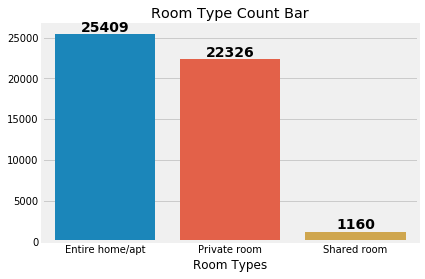

In [26]:
#Number of Room Types Available
room_type_plot = sns.countplot(x="room_type", order = df.room_type.value_counts().index, data=df)
room_type_plot.set(xlabel='Room Types', ylabel='', title='Room Type Count Bar')
for bar in room_type_plot.patches:
    h = bar.get_height()
    room_type_plot.text(
        bar.get_x() + bar.get_width()/2.,  # bar index (x coordinate of text)
        h,                                 # y coordinate of text
        '%d' % int(h),                     # y label
        ha='center', 
        va='bottom',
        color='black',
        fontweight='bold',
        size=14)
    
plt.show()

In [27]:
#Percentage Representation of Neighbourhood Group in Pie
df.neighbourhood_group.value_counts(dropna = False, normalize = True)

Manhattan       0.44
Brooklyn        0.41
Queens          0.12
Bronx           0.02
Staten Island   0.01
Name: neighbourhood_group, dtype: float64

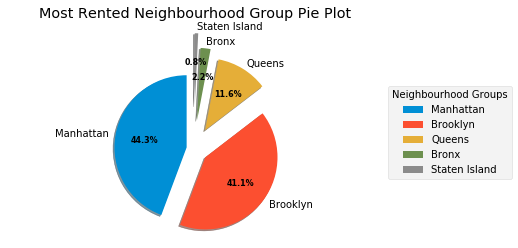

In [28]:
labels = df.neighbourhood_group.value_counts().index
sizes = df.neighbourhood_group.value_counts().values
explode = (0.1, 0.2, 0.3, 0.4, 0.6)

fig, ax = plt.subplots()
wedges, texts, autotexts = ax.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
                                   shadow=True, startangle=90)
ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax.set(title="Most Rented Neighbourhood Group Pie Plot")
ax.legend(wedges, labels,
          title="Neighbourhood Groups",
          loc="center left",
          bbox_to_anchor=(1, 0, 0.5, 1))
plt.setp(autotexts, size=8, weight="bold")
plt.show()

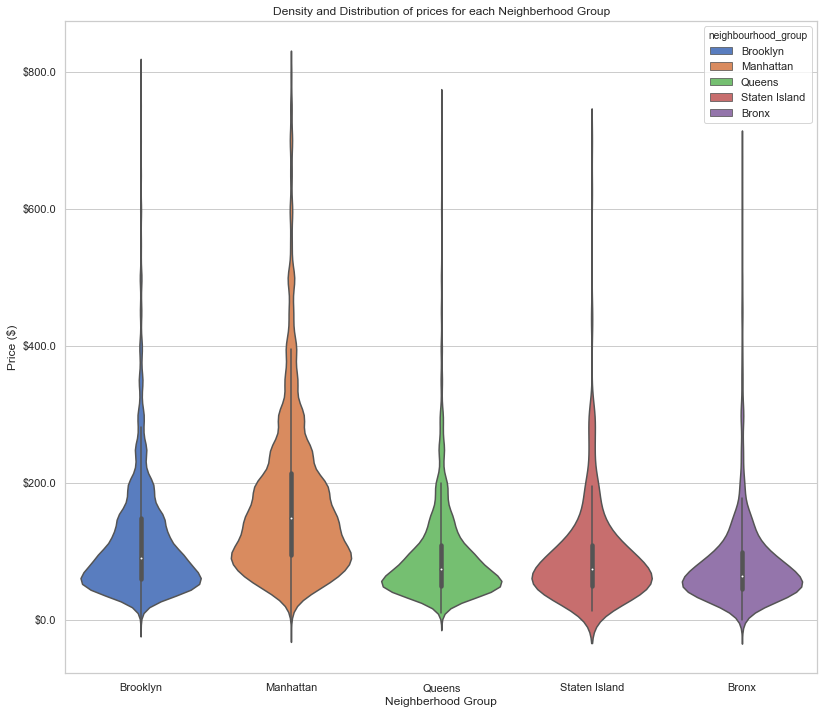

In [29]:
#Density and Distribution of Prices for each Neighbourhood Group
sns.set(style="whitegrid")

FILTER_PRICE_VALUE = 800

sub_df_price = df[df.price < FILTER_PRICE_VALUE]

fig, ax = plt.subplots(figsize=(12, 12))
density_neigh_price_plot = sns.violinplot(ax=ax, x="neighbourhood_group", y="price", 
                                          hue="neighbourhood_group", data=sub_df_price, 
                                          palette="muted", dodge=False)
density_neigh_price_plot.set(xlabel='Neighberhood Group', ylabel='Price ($)', 
                             title='Density and Distribution of prices for each Neighberhood Group')
ylabels = ['${}'.format(x) for x in density_neigh_price_plot.get_yticks()]
density_neigh_price_plot.set_yticklabels(ylabels)
plt.show()

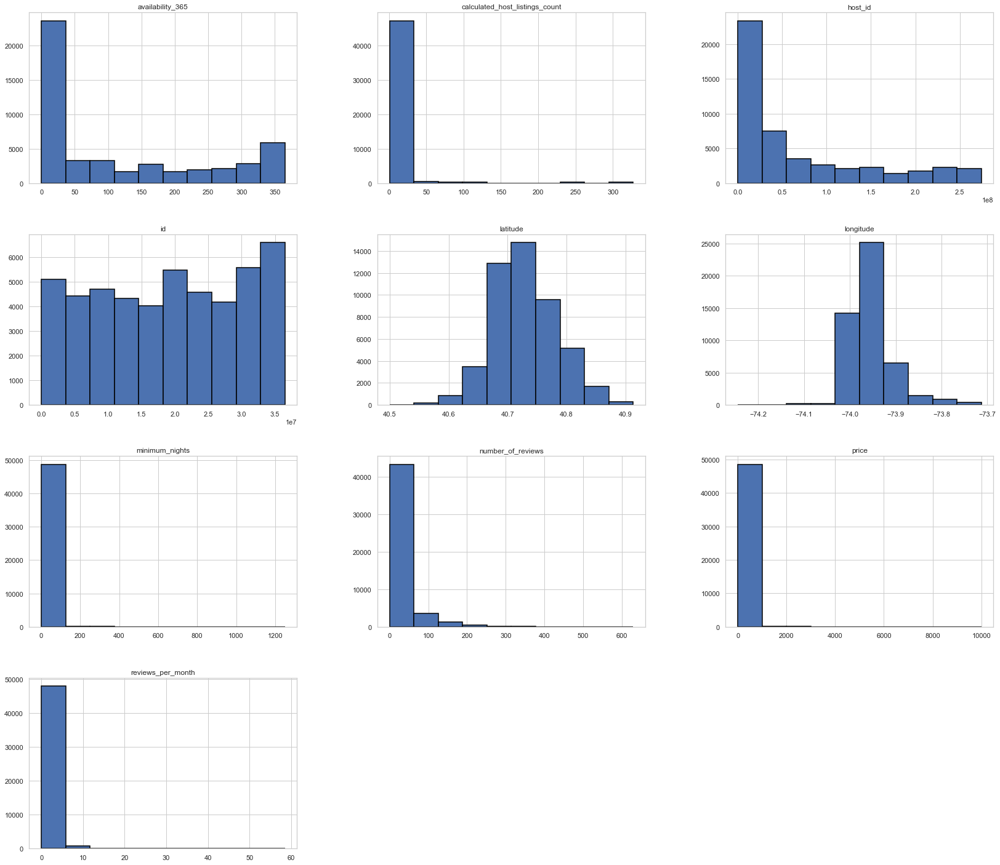

In [30]:
df.hist(edgecolor="Black", linewidth=1.5, figsize=(25, 25));

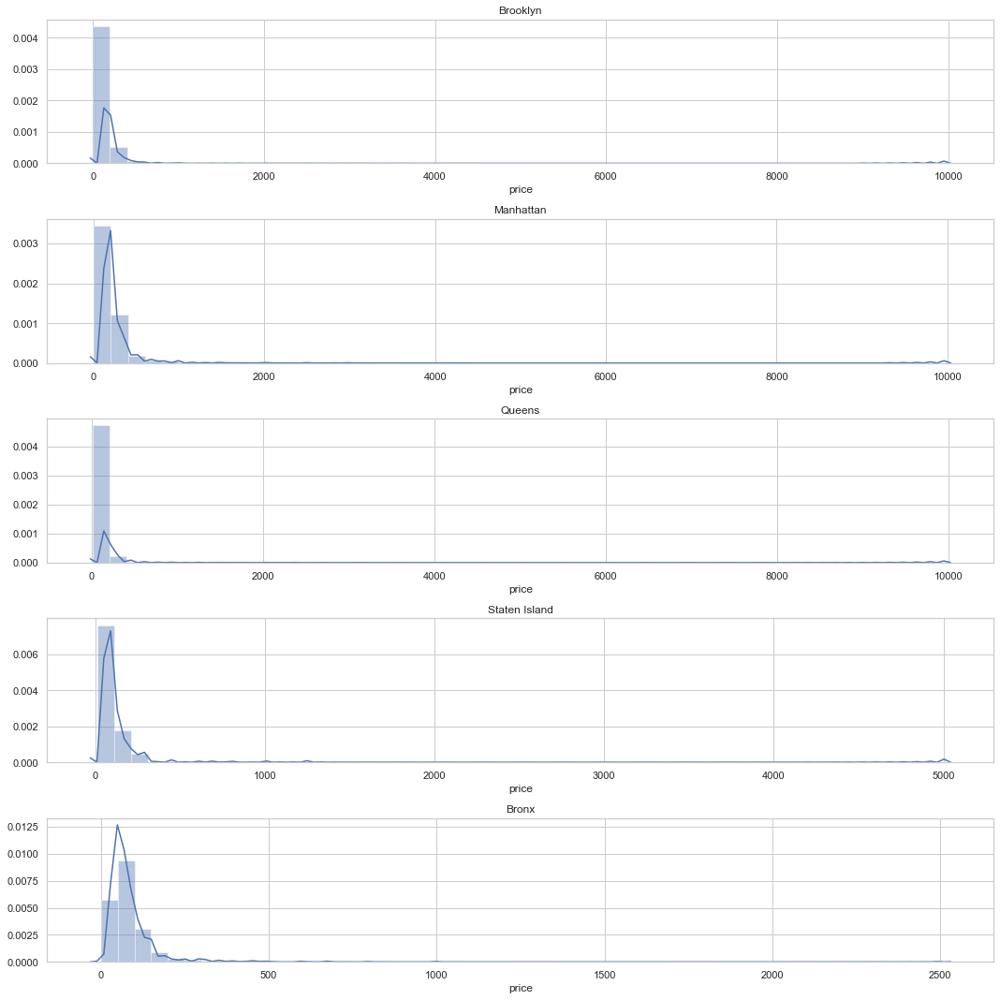

In [32]:
figure, subplots = plt.subplots(
                len(df.neighbourhood_group.unique()), 
                figsize=(15, 15)
            )
for i, neighbourhood_group in enumerate(df.neighbourhood_group.unique()):
    neighbourhoods = df[df.neighbourhood_group == neighbourhood_group]['price']
    ax = subplots[i]
    dist_plot = sns.distplot(neighbourhoods, ax=ax)
    dist_plot.set_title(neighbourhood_group)
plt.tight_layout(h_pad=1)
plt.show()

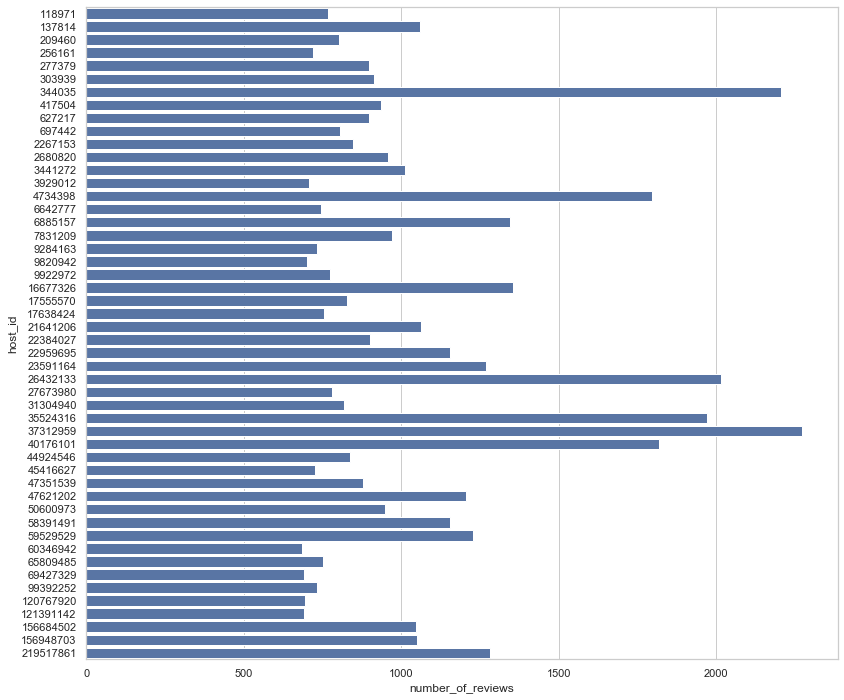

In [33]:
#Number of reviews grouped by Host Id
serie_df = df.groupby("host_id")["number_of_reviews"].agg("sum")
frame = { 'host_id': serie_df.index, 'number_of_reviews': serie_df.values }
df_df = pd.DataFrame(frame).sort_values('number_of_reviews', ascending=False).head(50)

f, ax = plt.subplots(figsize=(12, 12))
sns.barplot(x="number_of_reviews", y="host_id", 
            data=df_df, color="b", ax=ax, orient="h")

plt.show()

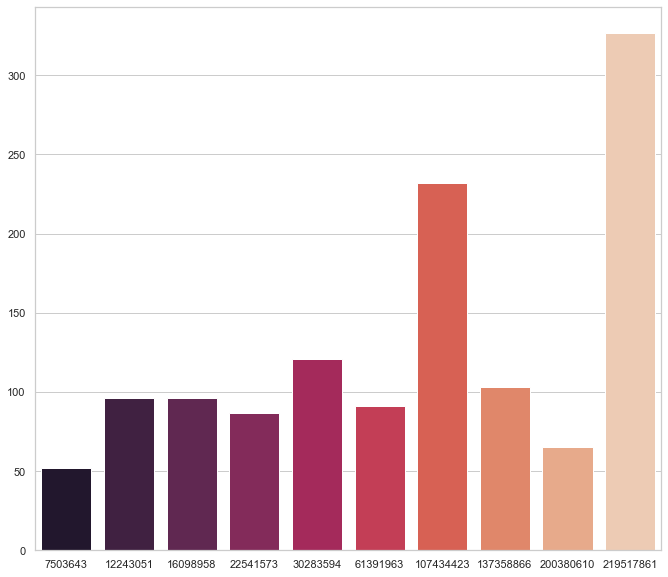

In [34]:
#top 10 host
df1 = df.host_id.value_counts()[:10]
f,ax = plt.subplots(figsize=(10,10))
ax = sns.barplot(x = df1.index,y=df1.values,palette="rocket")
plt.show()

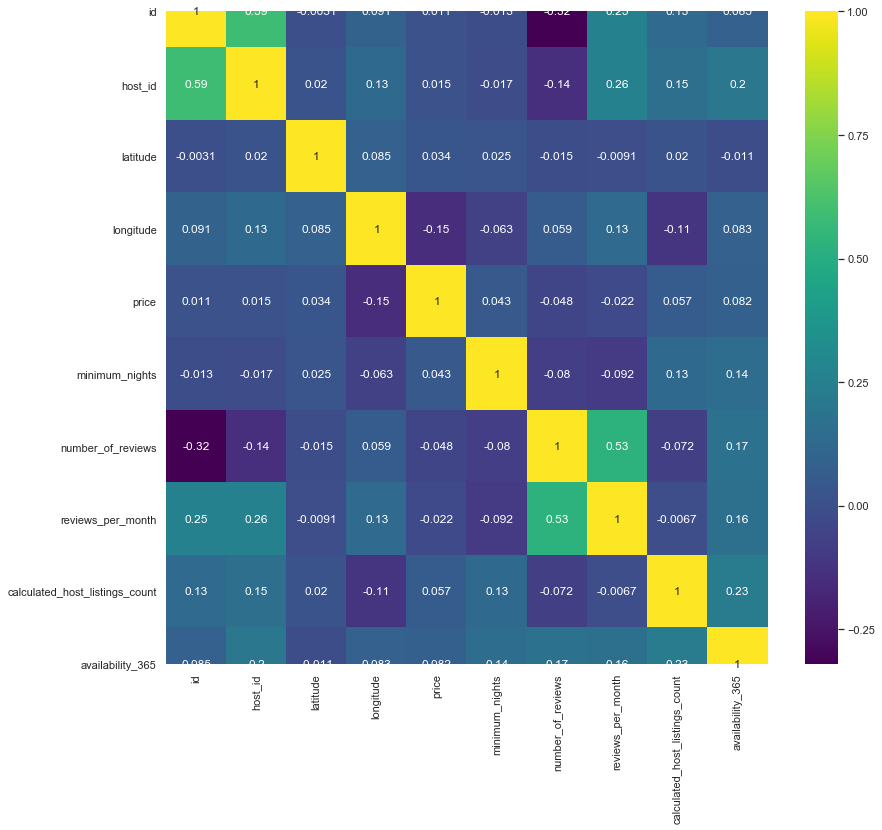

In [31]:
corr = df.corr()
plt.figure(figsize=(12,12))
ax = sns.heatmap(df.corr(),annot=True, cmap = 'viridis')

In [35]:
fig = px.scatter(df, x="availability_365", y="host_id",
	         size="number_of_reviews", color="neighbourhood_group",
                 hover_name="host_name", title="Number of reviews/Availability 365 per Host ID/ Host Name")

fig.update_layout(legend_orientation="h")
fig.update_layout(
    xaxis=go.layout.XAxis(
        title=go.layout.xaxis.Title(
            text="Availability 365",
            font=dict(
                family="Courier New, monospace",
                size=13,
                color="#7f7f7f"
            )
        )
    ),
    yaxis=go.layout.YAxis(
        title=go.layout.yaxis.Title(
            text="Host Id",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="#7f7f7f"
            )
        )
    )
)

fig.show()

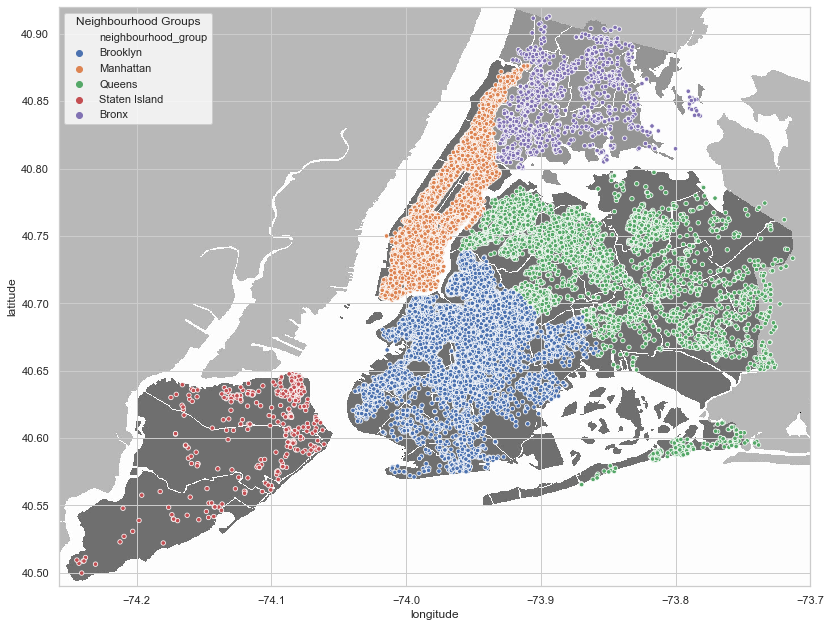

In [36]:
fig, ax = plt.subplots(figsize=(12,12))

img=plt.imread("/Users/shilp/Downloads/new-york-city-airbnb-open-data/New_York_City_.png", 0)
coordenates_to_extent = [-74.258, -73.7, 40.49, 40.92]
ax.imshow(img, zorder=0, extent=coordenates_to_extent)

scatter_map = sns.scatterplot(x='longitude', y='latitude', hue='neighbourhood_group',s=20, ax=ax, data=df)
ax.grid(True)
plt.legend(title='Neighbourhood Groups')
plt.show()

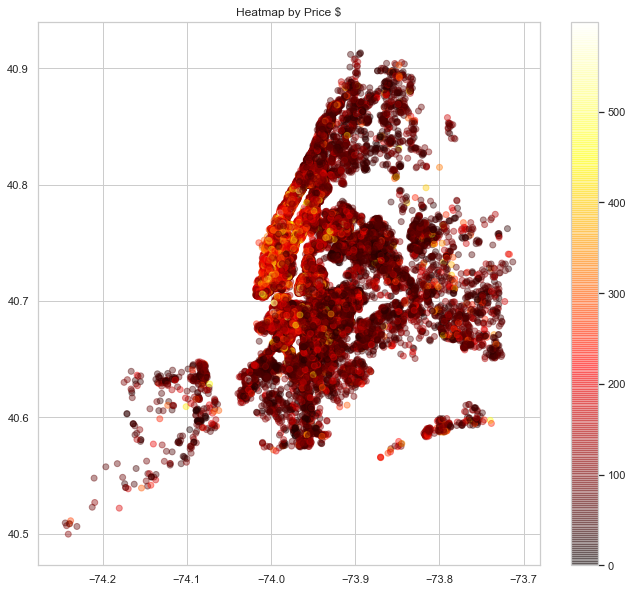

In [37]:
FILTER_PRICE_VALUE = 600
sub_df = df[df.price < FILTER_PRICE_VALUE]

fig, ax = plt.subplots(figsize=(10, 10))

cmap = plt.get_cmap('hot')
c = sub_df.price           
alpha = 0.5                
label = "airbnb"
price_heatmap = ax.scatter(sub_df.longitude, sub_df.latitude, label=label, c=c, cmap=cmap, alpha=0.4)
plt.title("Heatmap by Price $")
plt.colorbar(price_heatmap)
plt.grid(True)
plt.show()

<Figure size 1800x1800 with 0 Axes>

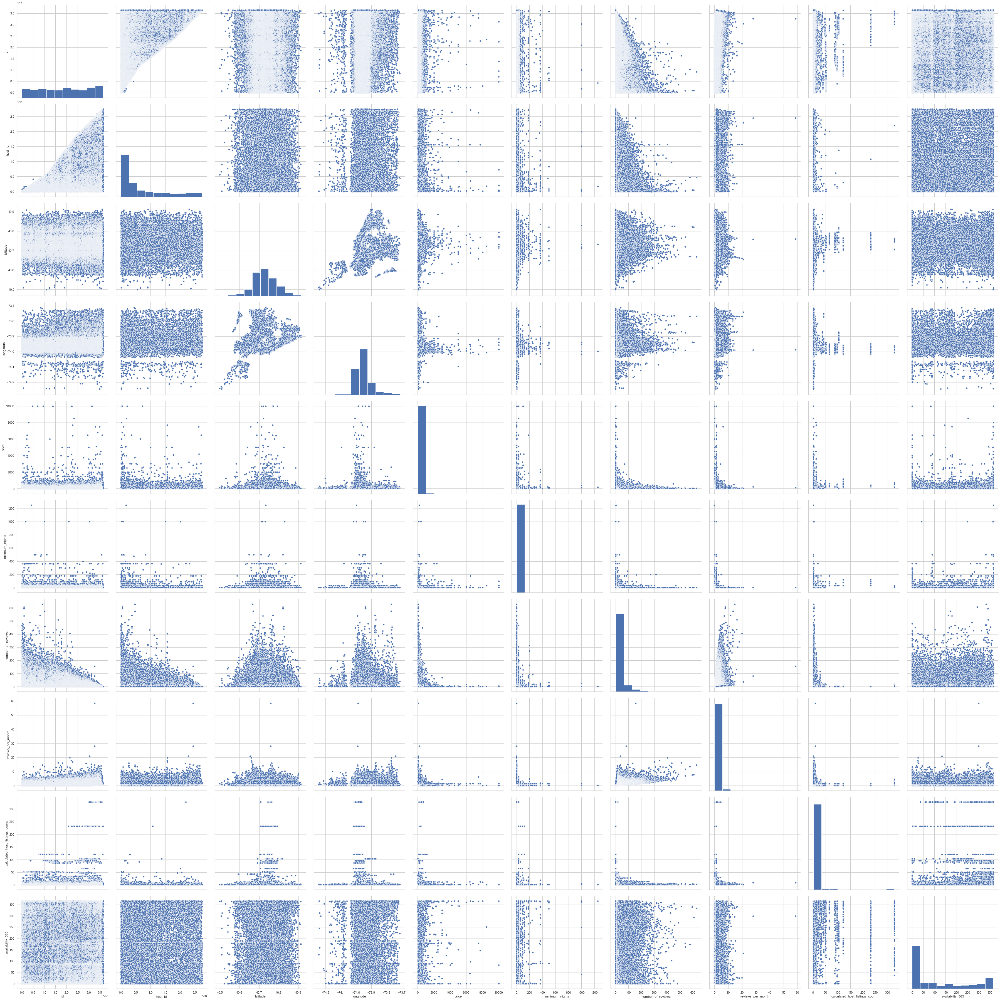

In [38]:
plt.figure(figsize=(25, 25))
sns.pairplot(df, height=5, diag_kind="hist")

In [ ]:
print("Density plots")
df.plot(kind='Density', subplots=True, layout=(16,16), sharex=False, figsize=(150,150))
plt.show()

In [41]:
categorical_col = []
for column in df.columns:
    if len(df[column].unique()) <= 10:
        print("===============================================================================")
        print(f"{column} : {df[column].unique()}")
        categorical_col.append(column)
categorical_col

neighbourhood_group : ['Brooklyn' 'Manhattan' 'Queens' 'Staten Island' 'Bronx']
room_type : ['Private room' 'Entire home/apt' 'Shared room']


['neighbourhood_group', 'room_type']

In [42]:
dataset = pd.get_dummies(df, columns=categorical_col)
dataset.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,price,minimum_nights,number_of_reviews,...,calculated_host_listings_count,availability_365,neighbourhood_group_Bronx,neighbourhood_group_Brooklyn,neighbourhood_group_Manhattan,neighbourhood_group_Queens,neighbourhood_group_Staten Island,room_type_Entire home/apt,room_type_Private room,room_type_Shared room
0,2539,Clean & quiet apt home by the park,2787,John,Kensington,40.65,-73.97,149,1,9,...,6,365,0,1,0,0,0,0,1,0
1,2595,Skylit Midtown Castle,2845,Jennifer,Midtown,40.75,-73.98,225,1,45,...,2,355,0,0,1,0,0,1,0,0
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Harlem,40.81,-73.94,150,3,0,...,1,365,0,0,1,0,0,0,1,0
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Clinton Hill,40.69,-73.96,89,1,270,...,1,194,0,1,0,0,0,1,0,0
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,East Harlem,40.80,-73.94,80,10,9,...,1,0,0,0,1,0,0,1,0,0


In [43]:
print(df.columns)
print(dataset.columns)

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')
Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood', 'latitude',
       'longitude', 'price', 'minimum_nights', 'number_of_reviews',
       'last_review', 'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'neighbourhood_group_Bronx',
       'neighbourhood_group_Brooklyn', 'neighbourhood_group_Manhattan',
       'neighbourhood_group_Queens', 'neighbourhood_group_Staten Island',
       'room_type_Entire home/apt', 'room_type_Private room',
       'room_type_Shared room'],
      dtype='object')


In [44]:
print(dataset.describe().loc["mean", :])
print("====================================")
print(dataset.describe().loc["std", :])

id                                  19017143.24
host_id                             67620010.65
latitude                                  40.73
longitude                                -73.95
price                                    152.72
minimum_nights                             7.03
number_of_reviews                         23.27
reviews_per_month                          1.37
calculated_host_listings_count             7.14
availability_365                         112.78
neighbourhood_group_Bronx                  0.02
neighbourhood_group_Brooklyn               0.41
neighbourhood_group_Manhattan              0.44
neighbourhood_group_Queens                 0.12
neighbourhood_group_Staten Island          0.01
room_type_Entire home/apt                  0.52
room_type_Private room                     0.46
room_type_Shared room                      0.02
Name: mean, dtype: float64
id                                  10983108.39
host_id                             78610967.03
latitude     

In [45]:
from sklearn.preprocessing import StandardScaler

col_to_scale = ['host_id', 'latitude', 'longitude', 'price', 'minimum_nights', 'number_of_reviews',
                'reviews_per_month', 'calculated_host_listings_count', 'availability_365']
s_sc = StandardScaler()
dataset[col_to_scale] = s_sc.fit_transform(dataset[col_to_scale])

In [46]:
print(dataset.describe().loc["mean", :])
print("====================================")
print(dataset.describe().loc["std", :])

id                                  19017143.24
host_id                                   -0.00
latitude                                   0.00
longitude                                  0.00
price                                     -0.00
minimum_nights                            -0.00
number_of_reviews                         -0.00
reviews_per_month                         -0.00
calculated_host_listings_count             0.00
availability_365                           0.00
neighbourhood_group_Bronx                  0.02
neighbourhood_group_Brooklyn               0.41
neighbourhood_group_Manhattan              0.44
neighbourhood_group_Queens                 0.12
neighbourhood_group_Staten Island          0.01
room_type_Entire home/apt                  0.52
room_type_Private room                     0.46
room_type_Shared room                      0.02
Name: mean, dtype: float64
id                                  10983108.39
host_id                                    1.00
latitude     

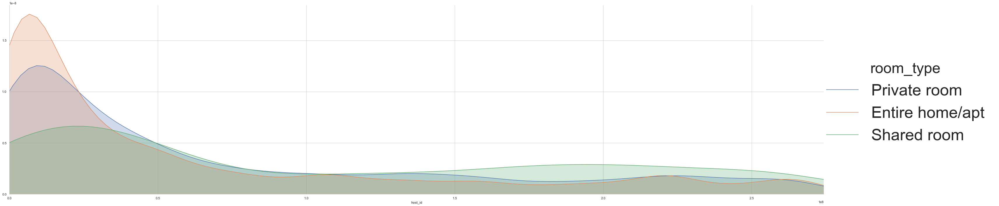

In [47]:
fig = sns.FacetGrid(df, hue="room_type", aspect=4, height=10)
fig.map(sns.kdeplot, 'host_id', shade=True)
oldest = df['host_id'].max()
fig.set(xlim=(0, oldest))
sns.set(font_scale=5)
fig.add_legend()

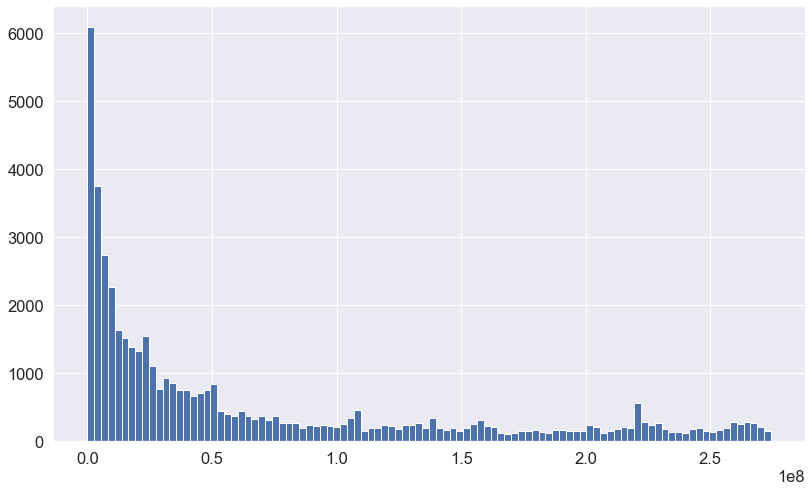

In [48]:
sns.set(font_scale=1.5)
plt.figure(figsize=(12, 8))
df.host_id.hist(bins=100)

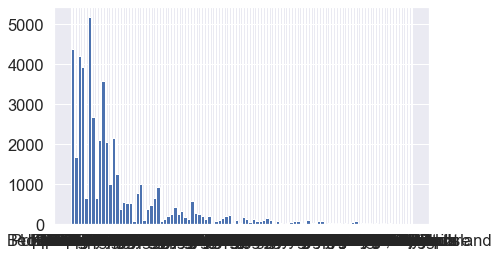

In [49]:
df.neighbourhood.hist(bins=100)

<BarContainer object of 10 artists>

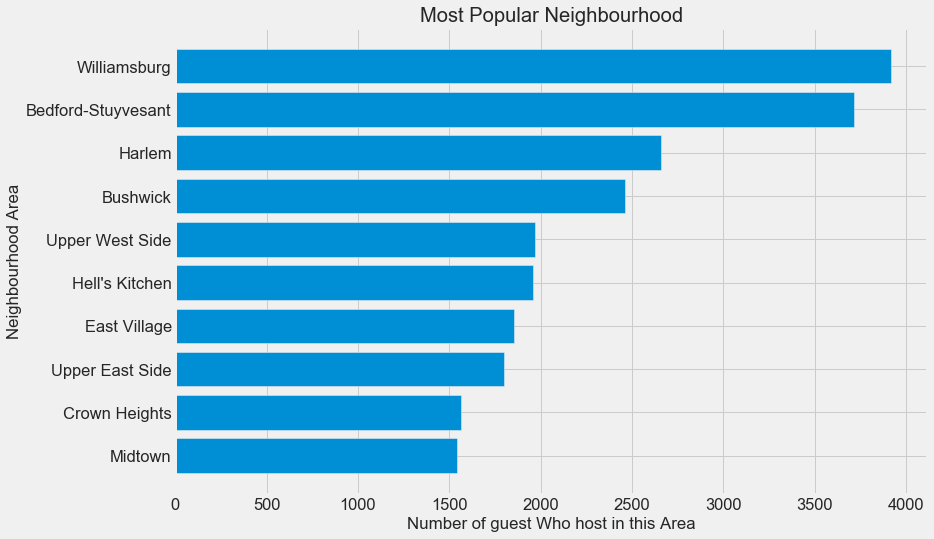

In [50]:
plt.style.use("fivethirtyeight")

data = df.neighbourhood.value_counts()[:10]
plt.figure(figsize=(12, 8))
x = list(data.index)
y = list(data.values)
x.reverse()
y.reverse()

plt.title("Most Popular Neighbourhood")
plt.ylabel("Neighbourhood Area")
plt.xlabel("Number of guest Who host in this Area")

plt.barh(x, y)

In [51]:

airbnb=pd.read_csv('/Users/shilp/Downloads/new-york-city-airbnb-open-data/AB_NYC_2019.csv')

airbnb.drop(['name','id','host_name','last_review'],axis=1,inplace=True)
airbnb['reviews_per_month']=airbnb['reviews_per_month'].replace(np.nan, 0)

In [52]:

le = preprocessing.LabelEncoder()                                            # Fit label encoder
le.fit(airbnb['neighbourhood_group'])
airbnb['neighbourhood_group']=le.transform(airbnb['neighbourhood_group'])    # Transform labels to normalized encoding.

le = preprocessing.LabelEncoder()
le.fit(airbnb['neighbourhood'])
airbnb['neighbourhood']=le.transform(airbnb['neighbourhood'])

le = preprocessing.LabelEncoder()
le.fit(airbnb['room_type'])
airbnb['room_type']=le.transform(airbnb['room_type'])

airbnb.sort_values(by='price',ascending=True,inplace=True)

airbnb.head()

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
25796,86327101,1,13,40.68,-73.91,1,0,1,95,4.35,6,222
25634,15787004,1,28,40.69,-73.92,1,0,2,16,0.71,5,0
25433,131697576,0,62,40.83,-73.89,1,0,2,55,2.56,4,127
25753,1641537,1,91,40.72,-73.94,1,0,2,12,0.53,2,0
23161,8993084,1,13,40.69,-73.95,1,0,4,1,0.05,4,28


In [53]:

list(le.inverse_transform(airbnb['room_type']))[:10]

['Private room',
 'Private room',
 'Private room',
 'Private room',
 'Private room',
 'Private room',
 'Shared room',
 'Entire home/apt',
 'Private room',
 'Shared room']

In [54]:

lm = LinearRegression()

X = airbnb[['host_id','neighbourhood_group','neighbourhood','latitude','longitude','room_type','minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365']]
y = airbnb['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

lm.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [55]:

predicts = lm.predict(X_test)

print("""
        Mean Squared Error: {}
        R2 Score: {}
        Mean Absolute Error: {}
     """.format(
        np.sqrt(metrics.mean_squared_error(y_test, predicts)),
        r2_score(y_test,predicts) * 100,
        mean_absolute_error(y_test,predicts)
        ))


        Mean Squared Error: 180.7340965693626
        R2 Score: 11.63957678232357
        Mean Absolute Error: 72.86091366825617
     


#kfold

Input: from sklearn.model_selection import cross_val_score
       scores = cross_val_score(lm, X_train, y_train, scoring="neg_mean_squared_error", cv=5)
       lm_rmse_scores = np.sqrt(-scores)
       print("""
        Scores: {}
        Mean: {}
        Standard deviation: {}
        """.format(
        lm_rmse_scores,
        lm_rmse_scores.mean(),
        lm_rmse_scores.std())
        )

Output:
        Scores: [237.22555275 282.19382235 186.82124459 234.60652944 247.47577519]
        Mean: 237.66458486316475
        Standard deviation: 30.57352498208825

In [61]:
error_airbnb = pd.DataFrame({
        'Actual Values': np.array(y_test).flatten(),
        'Predicted Values': predicts.flatten()}).head(20)

error_airbnb.head(5)

,Actual Values,Predicted Values
0,99,135.11
1,40,210.60
2,149,176.22
3,80,100.44
4,95,88.55


In [63]:
title=['Pred vs Actual']
fig = go.Figure(data=[
    go.Bar(name='Predicted', x=error_airbnb.index, y=error_airbnb['Predicted Values']),
    go.Bar(name='Actual', x=error_airbnb.index, y=error_airbnb['Actual Values'])
])

fig.update_layout(barmode='group')
fig.show()

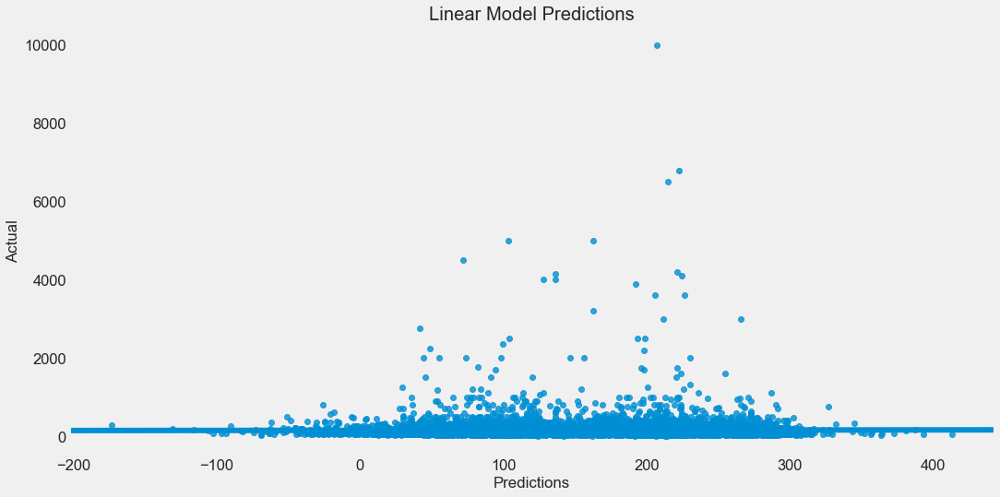

In [64]:
plt.figure(figsize=(16,8))
sns.regplot(predicts,y_test)
plt.xlabel('Predictions')
plt.ylabel('Actual')
plt.title("Linear Model Predictions")
plt.grid(False)
plt.show()

In [65]:
#cluster

In [66]:
df.neighbourhood.unique()

array(['Kensington', 'Midtown', 'Harlem', 'Clinton Hill', 'East Harlem',
       'Murray Hill', 'Bedford-Stuyvesant', "Hell's Kitchen",
       'Upper West Side', 'Chinatown', 'South Slope', 'West Village',
       'Williamsburg', 'Fort Greene', 'Chelsea', 'Crown Heights',
       'Park Slope', 'Windsor Terrace', 'Inwood', 'East Village',
       'Greenpoint', 'Bushwick', 'Flatbush', 'Lower East Side',
       'Prospect-Lefferts Gardens', 'Long Island City', 'Kips Bay',
       'SoHo', 'Upper East Side', 'Prospect Heights',
       'Washington Heights', 'Woodside', 'Brooklyn Heights',
       'Carroll Gardens', 'Gowanus', 'Flatlands', 'Cobble Hill',
       'Flushing', 'Boerum Hill', 'Sunnyside', 'DUMBO', 'St. George',
       'Highbridge', 'Financial District', 'Ridgewood',
       'Morningside Heights', 'Jamaica', 'Middle Village', 'NoHo',
       'Ditmars Steinway', 'Flatiron District', 'Roosevelt Island',
       'Greenwich Village', 'Little Italy', 'East Flatbush',
       'Tompkinsville', 'Asto

In [67]:
df_onehot = pd.get_dummies(df[['price']], prefix = "", prefix_sep = "")
df_onehot['neighbourhood'] = df['neighbourhood']
fixed_columns = [df_onehot.columns[-1]] + list(df_onehot.columns[:-1])
df_grouped = df_onehot.groupby('neighbourhood').mean().reset_index()
df_grouped.head(20)

,neighbourhood,price
0,Allerton,87.60
1,Arden Heights,67.25
2,Arrochar,115.00
3,Arverne,171.78
4,Astoria,117.19
5,Bath Beach,81.76
6,Battery Park City,367.56
7,Bay Ridge,144.43
8,Bay Terrace,142.00
9,"Bay Terrace, Staten Island",102.50


In [68]:
# Import libraries
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist

In [69]:
df_clustering = df_grouped.drop('neighbourhood',1)
df_clustering.head()

,price
0,87.60
1,67.25
2,115.00
3,171.78
4,117.19


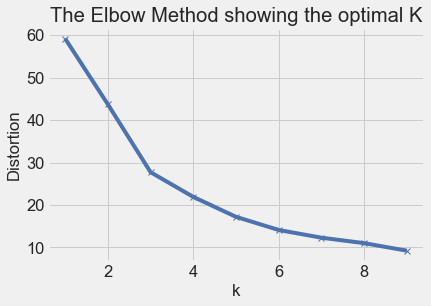

In [70]:
K = range(1,10)
distortions = []
for k in K:
    kmeans = KMeans(init = 'k-means++', n_clusters = k, n_init = 12, random_state = 0)
    kmeans.fit(df_clustering.values.reshape(-1,1))
    distortions.append(sum(np.min(cdist(df_clustering.values.reshape(-1, 1),kmeans.cluster_centers_, 'euclidean'), axis = 1)) / df_clustering.shape [0])

import matplotlib.pyplot as plt
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal K')
plt.show()  

In [71]:
num_clusters = 3

kmeans = KMeans(n_clusters = num_clusters, random_state = 0).fit(df_clustering)
kmeans.labels_

array([0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 2, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 2, 1, 0, 0, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 2,
       0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 2,
       0], dtype=int32)

In [72]:
df_grouped.insert(0, 'Cluster', kmeans.labels_)

In [73]:
df_grouped.head()

,Cluster,neighbourhood,price
0,0,Allerton,87.60
1,0,Arden Heights,67.25
2,0,Arrochar,115.00
3,1,Arverne,171.78
4,0,Astoria,117.19


In [74]:
df_co = df.copy()
df_co.drop_duplicates(subset = ['neighbourhood'])
drop_element = 'price'
df_co.drop(drop_element, axis = 1)
df_co.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.65,-73.97,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75,-73.98,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.81,-73.94,Private room,150,3,0,0,1.37,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.69,-73.96,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.80,-73.94,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [75]:
df_merge = pd.merge(df_co, df_grouped[['Cluster','neighbourhood','price']],on = 'neighbourhood')
df_merge.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price_x,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,Cluster,price_y
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.65,-73.97,Private room,149,1,9,2018-10-19,0.21,6,365,0,92.89
1,63546,Large and Cozy Private Bedroom,308652,Antonín,Brooklyn,Kensington,40.64,-73.97,Private room,39,1,45,2019-05-16,0.46,2,365,0,92.89
2,125594,SUPER BIG AND COZY PRIVATE BEDROOM,308652,Antonín,Brooklyn,Kensington,40.64,-73.97,Private room,39,1,82,2019-05-19,0.94,2,365,0,92.89
3,267652,Private clean pleasant spacious room.,164675,Janice,Brooklyn,Kensington,40.64,-73.97,Private room,60,2,20,2019-01-21,0.42,1,347,0,92.89
4,282341,Kensington/Ditmas Park pied-a-terre,1471384,Dan,Brooklyn,Kensington,40.64,-73.97,Entire home/apt,90,30,3,2017-07-30,0.05,1,286,0,92.89


In [76]:
df_merge.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price_x,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,Cluster,price_y
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.65,-73.97,Private room,149,1,9,2018-10-19,0.21,6,365,0,92.89
1,63546,Large and Cozy Private Bedroom,308652,Antonín,Brooklyn,Kensington,40.64,-73.97,Private room,39,1,45,2019-05-16,0.46,2,365,0,92.89
2,125594,SUPER BIG AND COZY PRIVATE BEDROOM,308652,Antonín,Brooklyn,Kensington,40.64,-73.97,Private room,39,1,82,2019-05-19,0.94,2,365,0,92.89
3,267652,Private clean pleasant spacious room.,164675,Janice,Brooklyn,Kensington,40.64,-73.97,Private room,60,2,20,2019-01-21,0.42,1,347,0,92.89
4,282341,Kensington/Ditmas Park pied-a-terre,1471384,Dan,Brooklyn,Kensington,40.64,-73.97,Entire home/apt,90,30,3,2017-07-30,0.05,1,286,0,92.89


In [80]:
cluster_1 = df_merge.loc[df_merge['Cluster'] == 1]
cluster_1.head(3)
cluster_0 = df_merge.loc[df_merge['Cluster'] == 0]
cluster_0.head(3)
cluster_2 = df_merge.loc[df_merge['Cluster'] == 2]
cluster_0.head(3)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price_x,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,Cluster,price_y
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.65,-73.97,Private room,149,1,9,2018-10-19,0.21,6,365,0,92.89
1,63546,Large and Cozy Private Bedroom,308652,Antonín,Brooklyn,Kensington,40.64,-73.97,Private room,39,1,45,2019-05-16,0.46,2,365,0,92.89
2,125594,SUPER BIG AND COZY PRIVATE BEDROOM,308652,Antonín,Brooklyn,Kensington,40.64,-73.97,Private room,39,1,82,2019-05-19,0.94,2,365,0,92.89


In [81]:
cluster_1.shape

(18745, 18)

In [82]:
print('Cluster_0 mean price: ',cluster_0.price_x.mean())
print('Reviews in Cluster0:',len(cluster_0.number_of_reviews))
print('Cluster_1 mean price: ',cluster_1.price_x.mean())
print('Reviews in Cluster1:',len(cluster_1.number_of_reviews))
print('Cluster_2 mean price: ',cluster_2.price_x.mean())
print('Reviews in Cluster2:',len(cluster_2.number_of_reviews))

Cluster_0 mean price:  111.33186416908745
Reviews in Cluster0: 29949
Cluster_1 mean price:  215.24358495598827
Reviews in Cluster1: 18745
Cluster_2 mean price:  488.85074626865674
Reviews in Cluster2: 201


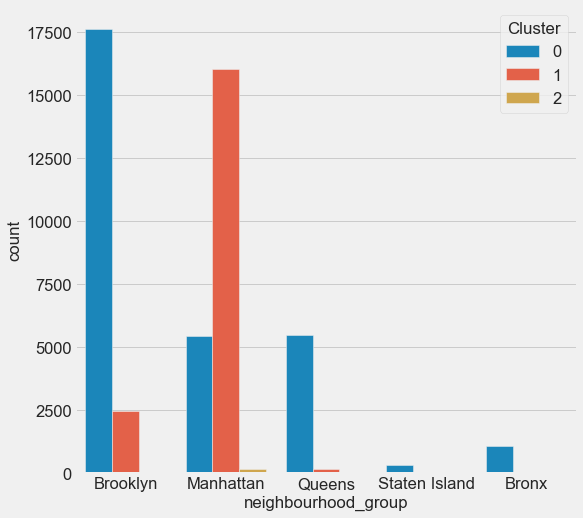

In [83]:
import matplotlib.pyplot as plt
plt.figure(figsize = (8,8))
sns.countplot(x = 'neighbourhood_group', hue = 'Cluster', data = df_merge)

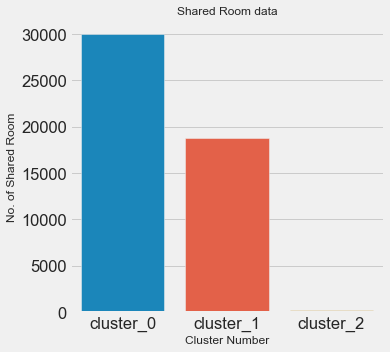

In [84]:
df_clu=pd.DataFrame(np.arange(3).reshape((1,3)),index=['0'],columns=['cluster_0','cluster_1','cluster_2'])
df_clu.cluster_0 = len(cluster_0)
df_clu.cluster_1 = len(cluster_1)
df_clu.cluster_2 = len(cluster_2)

plt.figure(figsize = (5,5))
sns.barplot(data = df_clu)
plt.xlabel('Cluster Number',fontsize =12)
plt.ylabel('No. of Shared Room', fontsize = 12)
plt.title('Shared Room data',fontsize = 12 )
plt.show()

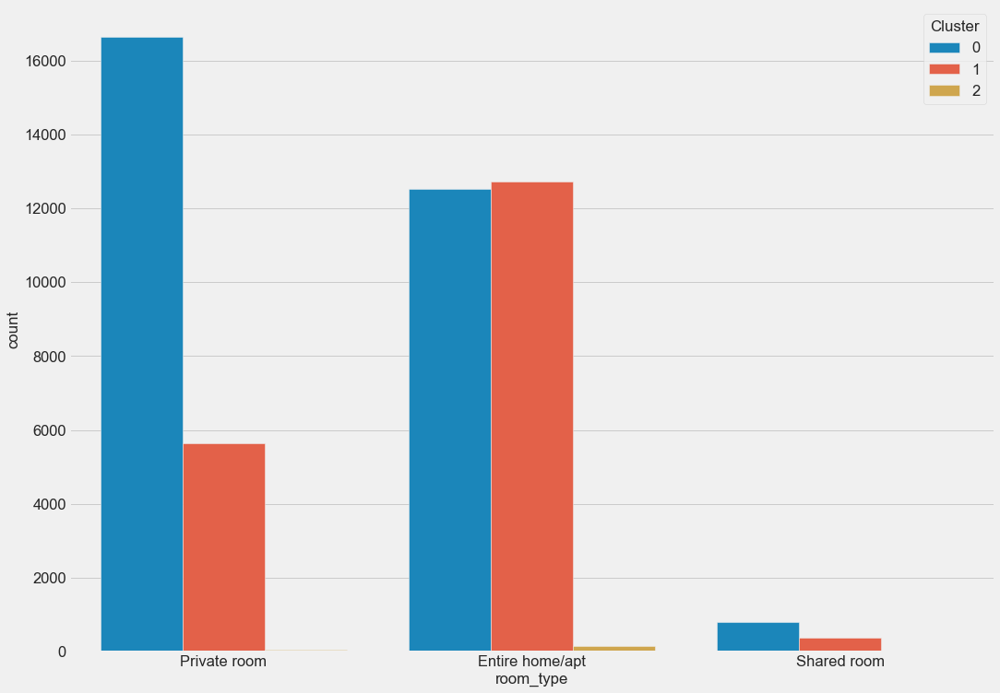

In [94]:
plt.figure(figsize = (16,12))
sns.countplot(x = 'room_type', hue = 'Cluster', data = df_merge)

# For algorithm and kfold, I made a new file becuse this worked when I made them, as of now when i ran the codes in this file I got errors, In other file everything worked effeciently.